In [1]:
import pandas as pd
import requests
import re
import time
from bs4 import BeautifulSoup
from collections import Counter

In [2]:
import warnings
warnings.filterwarnings('ignore')

## Functions

In [3]:
def fetch(url):
    """
    Use BeautifulSoup to get the text of a web page.
    """
    r = requests.get(url)
    comm = re.compile("<!--|-->")
    soup = BeautifulSoup(comm.sub("", r.text), "html.parser")
    return soup

Steps:
- Go to Sports-Reference's conference tournament page to get the conference acronyms (for url)
- For each season, go and get BPM of each player for all 32 conferences

In [73]:
# Get acronyms for all 32 conferences
conf_tourney_url = 'https://www.sports-reference.com/cbb/seasons/2019-conference-tournaments.html'
conf_tourney_soup = fetch(conf_tourney_url)
conf_tourney_table = conf_tourney_soup.find_all('table', {'id': 'conference-tournaments'})[0]
conf_dict = {}
for row in conf_tourney_table.find_all('th', {'data-stat': 'conf_name'}):
    if row.a:
        url = row.a['href']
        conf_name = url.replace('/cbb/conferences/', '')\
                       .replace('/2019.html#all_conference-tournament', '')
        conf_dict[conf_name.replace('/men', '')] = row.text
        
conf_acronyms = list(conf_dict.keys())

In [34]:
def get_season_cbb_bpm(year, conf_acronyms=conf_acronyms):
    print(f'CBB Season {year} Scraping...')
    
    spr_url = 'https://www.sports-reference.com'
    conf_dfs = []
    
    conf_acronyms_adj = conf_acronyms.copy()
    if year < 2014:
        conf_acronyms_adj.remove('aac')
        if year == 2011:
            conf_acronyms_adj.remove('pac-12')
            conf_acronyms_adj.append('pac-10')
    
    for conf in conf_acronyms_adj:
        time.sleep(30)
        conf_url = f'{spr_url}/cbb/conferences/{conf}/{year}-stats.html'
        print(conf_url)
        conf_soup = fetch(conf_url)
        conf_table = conf_soup.find_all('table', {'id': 'conference-stats'})[0]
        
        data = []
        cols = ['player', 'class', 'pos', 'school_name', 'games', 'mp', 'bpm']
        for row in conf_table.find_all('tr'):
            if len(row.find_all('td')) != 0:
                if row.find_all('td', {'data-stat': 'player'}):
                    row_data = [row.find_all('td', {'data-stat': col})[0].text
                                for col in cols]
                    row_data.append(row.find_all('td', {'data-stat': 'player'})[0].a['href'])
                    data.append(row_data)
        conf_df = pd.DataFrame(data, columns=cols + ['spr_url'])
        conf_df['conference'] = conf
        
        conf_dfs.append(conf_df)
        
    
    output = pd.concat(conf_dfs)
    output['season'] = year
    
    print(f'CBB Season {year} Completed.')
    print()
    
    return output

In [6]:
for year in range(2011, 2022):
    get_season_cbb_bpm(year).to_csv(f'cbb_year_bpm/{year}.csv', index=False)
    time.sleep(10)

CBB Season 2011 Scraping...
CBB Season 2011 Completed.

CBB Season 2012 Scraping...
CBB Season 2012 Completed.

CBB Season 2013 Scraping...
CBB Season 2013 Completed.

CBB Season 2014 Scraping...
CBB Season 2014 Completed.

CBB Season 2015 Scraping...
CBB Season 2015 Completed.

CBB Season 2016 Scraping...
CBB Season 2016 Completed.

CBB Season 2017 Scraping...
CBB Season 2017 Completed.

CBB Season 2018 Scraping...
CBB Season 2018 Completed.

CBB Season 2019 Scraping...
CBB Season 2019 Completed.

CBB Season 2020 Scraping...
CBB Season 2020 Completed.

CBB Season 2021 Scraping...
CBB Season 2021 Completed.



In [9]:
year = 2022
get_season_cbb_bpm(year).to_csv(f'cbb_year_bpm/{year}.csv', index=False)

CBB Season 2022 Scraping...
CBB Season 2022 Completed.



In [35]:
year = 2023
get_season_cbb_bpm(year).to_csv(f'cbb_year_bpm/{year}.csv', index=False)

CBB Season 2023 Scraping...
https://www.sports-reference.com/cbb/conferences/aac/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/acc/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/america-east/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/atlantic-10/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/atlantic-sun/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/big-12/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/big-east/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/big-sky/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/big-south/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/big-ten/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/big-west/men/2023-stats.html
https://www.sports-reference.com/cbb/conferences/colonial/men/2023-stats.html
https://www.sports-reference.com/cbb/c

In [41]:
temp = pd.read_csv('cbb_year_bpm/2023.csv')
temp.rename(columns={'games': 'g'}).to_csv('cbb_year_bpm/2023.csv', index=False)

## EDA

In [42]:
raw_df = pd.concat([pd.read_csv(f'cbb_year_bpm/{year}.csv')
                    for year in range(2011, 2024)])
Counter(raw_df['season'])

Counter({2011: 4418,
         2012: 4491,
         2013: 4564,
         2014: 4766,
         2015: 4746,
         2016: 4778,
         2017: 4803,
         2018: 4741,
         2019: 4768,
         2020: 4827,
         2021: 5020,
         2022: 5091,
         2023: 5066})

In [43]:
raw_df['mpg'] = raw_df['mp'] / raw_df['g']
cbb_df = raw_df[((raw_df['mpg'] >= 10) | (raw_df['mp'] >= 200)) & 
                (raw_df['g'] >= 10) & (~raw_df['bpm'].isna())]
Counter(cbb_df['season'])

Counter({2011: 3103,
         2012: 3118,
         2013: 3179,
         2014: 3280,
         2015: 3322,
         2016: 3312,
         2017: 3339,
         2018: 3306,
         2019: 3351,
         2020: 3290,
         2021: 3102,
         2022: 3415,
         2023: 3450})

In [38]:
# cbb_df[(cbb_df['class'] == 'FR') &
#        (cbb_df['bpm'] > 10)].sort_values('bpm', ascending=False)

In [44]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import norm, skew
from IPython.core.pylabtools import figsize

In [45]:
sns.set()
matplotlib.rc('font', family='Heiti TC')

In [46]:
print(cbb_df['bpm'].median())

-0.7


Text(0.5, 0, 'BPM')

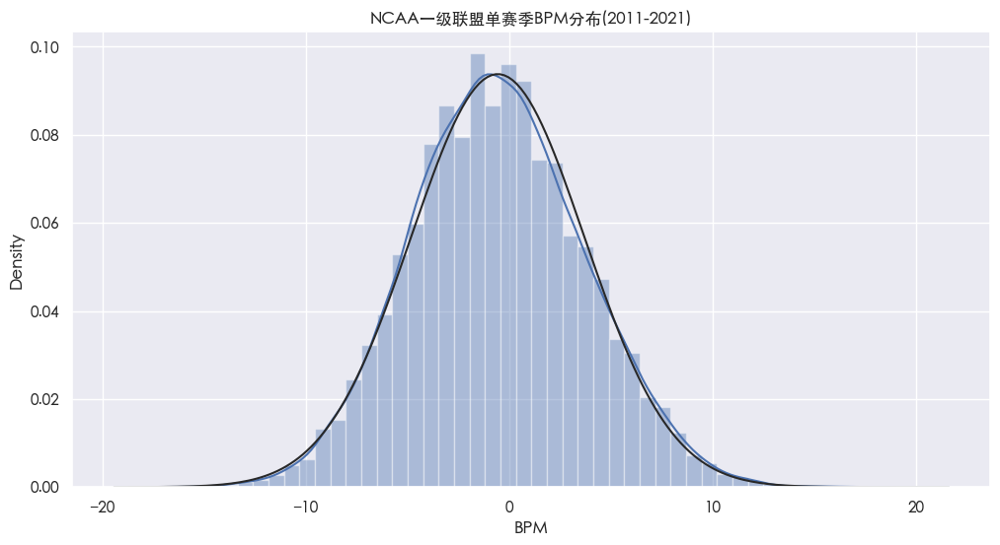

In [47]:
figsize(12, 6)
sns.distplot(cbb_df['bpm'], fit=norm)
plt.title('NCAA一级联盟单赛季BPM分布(2011-2021)')
plt.xlabel('BPM')

In [48]:
cbb_df[(cbb_df['class'] == 'FR')].sort_values('bpm', ascending=False).head(20)

,player,class,pos,school_name,g,mp,bpm,spr_url,conference,season,mpg
356,Zion Williamson,FR,F,Duke,33,990.0,20.1,/cbb/players/zion-williamson-1.html,acc,2019,30.000000
3391,Anthony Davis,FR,F,Kentucky,40,1281.0,17.2,/cbb/players/anthony-davis-5.html,sec,2012,32.025000
5010,Chet Holmgren,FR,C,Gonzaga,32,861.0,15.0,/cbb/players/chet-holmgren-1.html,wcc,2022,26.906250
63,Kyrie Irving,FR,G,Duke,11,303.0,14.8,/cbb/players/kyrie-irving-1.html,acc,2011,27.545455
3760,Karl-Anthony Towns,FR,F,Kentucky,39,822.0,14.3,/cbb/players/karl-anthony-towns-1.html,sec,2015,21.076923
3520,Evan Mobley,FR,F,Southern California,33,1120.0,13.7,/cbb/players/evan-mobley-1.html,pac-12,2021,33.939394
3536,Nerlens Noel,FR,F,Kentucky,24,765.0,12.1,/cbb/players/nerlens-noel-1.html,sec,2013,31.875000
3313,Lonzo Ball,FR,G,UCLA,36,1263.0,12.0,/cbb/players/lonzo-ball-1.html,pac-12,2017,35.083333
1502,D'Angelo Russell,FR,G,Ohio State,35,1188.0,11.9,/cbb/players/dangelo-russell-1.html,big-ten,2015,33.942857
791,Joel Embiid,FR,C,Kansas,28,647.0,11.9,/cbb/players/joel-embiid-1.html,big-12,2014,23.107143


In [49]:
cbb_df[(cbb_df['class'] == 'SO')].sort_values('bpm', ascending=False).head(20)

,player,class,pos,school_name,g,mp,bpm,spr_url,conference,season,mpg
1621,Keegan Murray,SO,F,Iowa,35,1116.0,15.7,/cbb/players/keegan-murray-1.html,big-ten,2022,31.885714
3874,Tari Eason,SO,F,Louisiana State,33,806.0,14.7,/cbb/players/tari-eason-1.html,sec,2022,24.424242
1407,Ethan Happ,SO,F,Wisconsin,37,1033.0,14.3,/cbb/players/ethan-happ-1.html,big-ten,2017,27.918919
3924,Walker Kessler,SO,F,Auburn,34,871.0,14.1,/cbb/players/walker-kessler-1.html,sec,2022,25.617647
901,Otto Porter,SO,F,Georgetown,31,1097.0,13.7,/cbb/players/otto-porter-1.html,big-east,2013,35.387097
1548,Zach Edey,SO,C,Purdue,37,703.0,13.1,/cbb/players/zach-edey-1.html,big-ten,2022,19.000000
1283,Trey Burke,SO,G,Michigan,39,1378.0,13.1,/cbb/players/trey-burke-1.html,big-ten,2013,35.333333
820,Tristan Clark,SO,F,Baylor,14,417.0,12.7,/cbb/players/tristan-clark-1.html,big-12,2019,29.785714
1701,Luke Eddy,SO,G,Elon,11,214.0,12.6,/cbb/players/luke-eddy-1.html,colonial,2015,19.454545
364,Mark Williams,SO,C,Duke,39,922.0,12.5,/cbb/players/mark-williams-7.html,acc,2022,23.641026


### Chinese Players

In [53]:
# Select players with draft year that is post-2015
cn_players = {'Michael Ou': '区俊炫', 'Michael Wang': '王泉泽', 'Kevin Zhang': '张镇麟', 
              'Benson Lin': '林庭谦', 'Ben Li': '李弘权', 'Johnny Wang': '王翊雄', 
              'Jeffrey Yan': '颜宇锋', 'Grant Sun': '孙鹤峰', 'Hefeng Sun': '孙鹤峰',
              'Tao Xu': '徐韬', 'Chris Tang': '唐子豪', 'Adili Kuerban': '阿迪力-库尔班',
              'Louis Tang': '唐维杰', 'Oscar Kao': '高国豪', 'Lewis Wang': '王律翔', 
              'Ray Chen': '陈盈骏', 'Alex Zhao': 'Qianjun Zhao', 'Siyao Sun': '孙思尧',
              'Ted Wang': '王泽铭', 'Jeff Wu': '吴永盛', 'Chien-Hao Ma': '马建豪',
              'David Muoka': 'David Muoka'}

In [133]:
cols = ['player', 'class', 'season', 'school_name', 'conference', 'g', 'mp', 'mpg', 'bpm']
temp = cbb_df[cbb_df['player'].isin(cn_players)][cols]
temp = temp.rename(columns={'player': '球员', 'class': '年级',
                            'school_name': '学校', 'g': '上场次数',
                            'mp': '上场时间', 'bpm': 'BPM', 
                            'conference': '赛区', 'season': '赛季',
                            'mpg': '场均上场时间'})
temp['上场时间'] = temp['上场时间'].apply(int)
temp['场均上场时间'] = temp['场均上场时间'].apply(lambda x: f'{x:.1f}')
temp['球员'] = temp['球员'].map(cn_players)
temp['赛区'] = temp['赛区'].map(conf_dict)
temp['年级'] = temp['年级'].map({'FR': '大一', 'SO': '大二', 'JR': '大三', 'SR': '大四'})
temp.sort_values('BPM', ascending=False)

,球员,年级,赛季,学校,赛区,上场次数,上场时间,场均上场时间,BPM
3148,David Muoka,大三,2022,Nevada-Las Vegas,Mountain West Conference,32,416,13.0,3.7
3116,David Muoka,大四,2023,Nevada-Las Vegas,Mountain West Conference,32,587,18.3,2.3
2251,王泉泽,大一,2019,Pennsylvania,Ivy League,26,471,18.1,1.3
4213,David Muoka,大二,2021,Lamar,Southland Conference,25,665,26.6,-1.1
3081,林庭谦,大一,2020,Bryant,Northeast Conference,32,752,23.5,-2.5
161,张镇麟,大二,2020,Tulane,American Athletic Conference,30,576,19.2,-2.7
3658,李弘权,大一,2021,Lehigh,Patriot League,14,170,12.1,-2.8
4078,David Muoka,大一,2020,Lamar,Southland Conference,32,552,17.2,-3.0
157,张镇麟,大一,2019,Tulane,American Athletic Conference,30,674,22.5,-3.2
1832,王翊雄,大四,2021,Cal State Fullerton,Big West Conference,14,182,13.0,-3.2


In [55]:
cbb_df[cbb_df['player'].isin(cn_players)].sort_values('bpm', ascending=False)

,player,class,pos,school_name,g,mp,bpm,spr_url,conference,season,mpg
3148,David Muoka,JR,C,Nevada-Las Vegas,32,416.0,3.7,/cbb/players/david-muoka-1.html,mwc,2022,13.000000
3116,David Muoka,SR,C,Nevada-Las Vegas,32,587.0,2.3,/cbb/players/david-muoka-1.html,mwc/men,2023,18.343750
2251,Michael Wang,FR,F,Pennsylvania,26,471.0,1.3,/cbb/players/michael-wang-1.html,ivy,2019,18.115385
4213,David Muoka,SO,C,Lamar,25,665.0,-1.1,/cbb/players/david-muoka-1.html,southland,2021,26.600000
3081,Benson Lin,FR,G,Bryant,32,752.0,-2.5,/cbb/players/benson-lin-1.html,northeast,2020,23.500000
161,Kevin Zhang,SO,G,Tulane,30,576.0,-2.7,/cbb/players/kevin-zhang-1.html,aac,2020,19.200000
3658,Ben Li,FR,F,Lehigh,14,170.0,-2.8,/cbb/players/ben-li-2.html,patriot,2021,12.142857
4078,David Muoka,FR,C,Lamar,32,552.0,-3.0,/cbb/players/david-muoka-1.html,southland,2020,17.250000
157,Kevin Zhang,FR,G,Tulane,30,674.0,-3.2,/cbb/players/kevin-zhang-1.html,aac,2019,22.466667
1832,Johnny Wang,SR,F,Cal State Fullerton,14,182.0,-3.2,/cbb/players/johnny-wang-1.html,big-west,2021,13.000000


### Japanese/Korean Players

In [131]:
# Select players with draft year that is post-2015
jk_players_p15 = {'Yuta Watanabe': '渡边雄太', 'Rui Hachimura': '八村垒', 'Kai Toews': '提布斯-海',
                  'Eito Yuminami': '弓波英人', 'Hyu Watanabe': '渡边飞勇', 'Avi Schafer': '舍费尔-幸树',
                  'Hyunjung Lee': '李贤政', 'Keisei Tominaga': '富永启生', 'Kaine Roberts': '凯恩-罗伯茨',
                  'Taku Youngblood': '須藤タイレル拓', 'Ibu Yamazaki': '山崎一涉', 'Yuto Yamanouchi': '山之内勇登',
                  'Mike Sharavjamts': '迈克-沙拉夫贾姆斯'}

In [132]:
cbb_df[cbb_df['player'].isin(jk_players_p15)].sort_values('season', ascending=False)

,player,class,pos,school_name,g,mp,bpm,spr_url,conference,season,mpg
4251,Yuto Yamanouchi,SO,C,Lamar,28,601.0,-7.9,/cbb/players/yuto-yamanouchi-1.html,southland,2023,21.464286
1950,Kaine Roberts,JR,G,Stony Brook,33,806.0,-8.3,/cbb/players/kaine-roberts-1.html,colonial,2023,24.424242
1645,Keisei Tominaga,SR,G,Nebraska,32,803.0,6.7,/cbb/players/keisei-tominaga-1.html,big-ten,2023,25.093750
1459,Ibu Yamazaki,SO,F,Radford,33,291.0,-2.7,/cbb/players/ibu-yamazaki-1.html,big-south,2023,8.818182
668,Mike Sharavjamts,SO,F,Dayton,32,740.0,-0.6,/cbb/players/mike-sharavjamts-1.html,atlantic-10,2023,23.125000
1670,Keisei Tominaga,SO,G,Nebraska,30,494.0,2.4,/cbb/players/keisei-tominaga-1.html,big-ten,2022,16.466667
628,Hyunjung Lee,JR,G,Davidson,34,1091.0,5.3,/cbb/players/hyunjung-lee-1.html,atlantic-10,2022,32.088235
643,Hyunjung Lee,SO,G,Davidson,22,657.0,7.8,/cbb/players/hyunjung-lee-1.html,atlantic-10,2021,29.863636
1798,Kai Toews,SO,G,North Carolina-Wilmington,13,345.0,-10.2,/cbb/players/kai-toews-1.html,colonial,2020,26.538462
607,Hyunjung Lee,FR,G,Davidson,28,584.0,4.1,/cbb/players/hyunjung-lee-1.html,atlantic-10,2020,20.857143


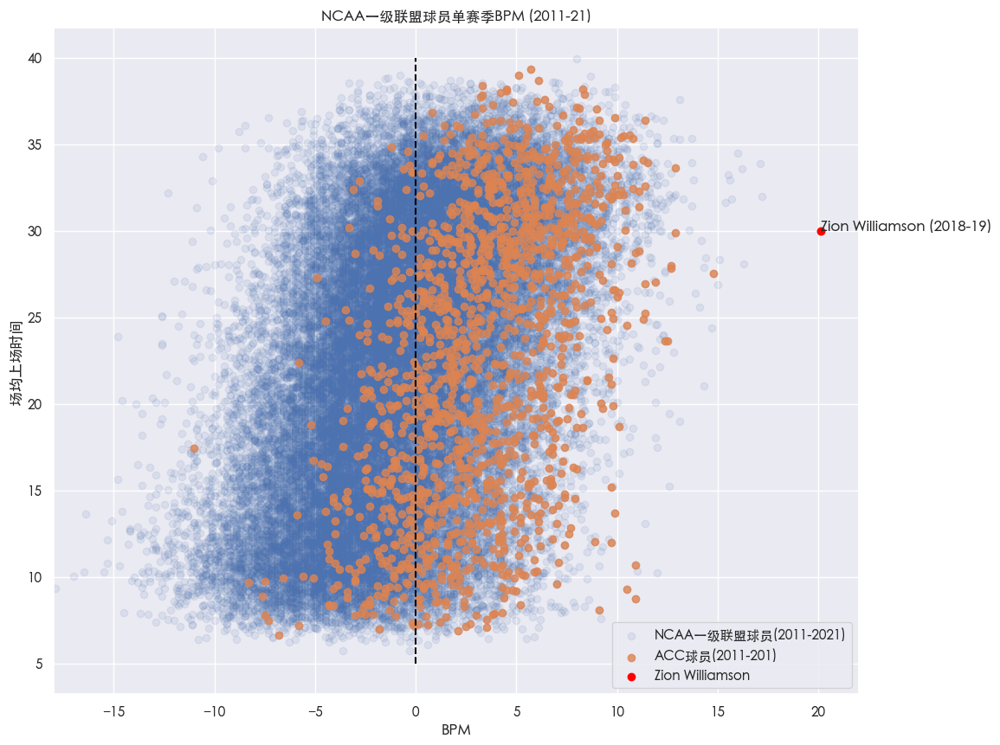

In [60]:
figsize(12, 10)
x = cbb_df['bpm'].values
y = cbb_df['mpg'].values
plt.scatter(x, y, alpha=0.1, label='NCAA一级联盟球员(2011-2021)')

conf = 'acc'
conf_cond = cbb_df['conference'] == conf
x_c = cbb_df[conf_cond]['bpm'].values
y_c = cbb_df[conf_cond]['mpg'].values
plt.scatter(x_c, y_c, alpha=0.8, label=f'ACC球员(2011-201)')
    
player = 'Zion Williamson'
player_cond = cbb_df['player'] == player
x_p = cbb_df[player_cond]['bpm'].values
y_p = cbb_df[player_cond]['mpg'].values
plt.scatter(x_p, y_p, color='red', label=player)
player_coord = (x_p[0], y_p[0])
plt.annotate(f'{player} (2018-19)', player_coord)
    

plt.title(f'NCAA一级联盟球员单赛季BPM (2011-21)')
    
plt.xlabel('BPM')
plt.ylabel('场均上场时间')
plt.xlim(-18,22)
plt.vlines(0, 5, 40, linestyles='--', colors='black')
plt.legend(loc=4)

## Visualization

In [75]:
def plot_player_bpm(player, conf, year, player_name_dict=cn_players, conf_dict=conf_dict):
    year_df = cbb_df[cbb_df['season'] == year]
    x = year_df['bpm'].values
    y = year_df['mpg'].values
    plt.scatter(x, y, alpha=0.1, label='NCAA一级联盟球员')

    conf_cond = year_df['conference'] == conf
    x_c = year_df[conf_cond]['bpm'].values
    y_c = year_df[conf_cond]['mpg'].values
    plt.scatter(x_c, y_c, alpha=0.8, label=f'{conf_dict[conf]}球员')
    
    if player != None:
        player_cond = year_df['player'] == player
        x_p = year_df[player_cond]['bpm'].values
        y_p = year_df[player_cond]['mpg'].values
        plt.scatter(x_p, y_p, color='red', label=f'{player_name_dict[player]} ({player})')
        player_coord = (x_p[0], y_p[0])
        plt.annotate(player_name_dict[player], player_coord)
    
    draftee_df = pd.read_csv(f'nba_draft_year_bpm/{year}.csv') 
    draftees_url = draftee_df[(draftee_df['conference'] == conf) &
                              (draftee_df['player'] != player)].merge(year_df, on=['spr_url'],
                                                                      how='inner')['spr_url'].values
    
    if len(draftees_url) > 0:
        draftee_cond = year_df['spr_url'].isin(draftees_url)
        draftees = year_df[draftee_cond]['player'].values
        x_d = year_df[draftee_cond]['bpm'].values
        y_d = year_df[draftee_cond]['mpg'].values
        plt.scatter(x_d, y_d, color='blue', label=f'{year}年同赛区被选中的球员')
        for i in range(len(draftees)):
            plt.annotate(draftees[i], (x_d[i], y_d[i]))
    
    season = f'{year-1}-{str(year)[2:]}'
    plt.title(f'{season}赛季NCAA一级联盟球员BPM')
    
    plt.xlabel('BPM')
    plt.ylabel('场均上场时间')
    plt.xlim(-18,22)
    plt.vlines(0, 5, 40, linestyles='--', colors='black')
    plt.legend(loc=4)

In [76]:
def plot_player_bpm(player, conf, year, player_name_dict=cn_players, conf_dict=conf_dict):
    year_df = cbb_df[cbb_df['season'] == year]
    x = year_df['bpm'].values
    y = year_df['mpg'].values
    plt.scatter(x, y, alpha=0.1, label='NCAA一级联盟球员')

    conf_cond = year_df['conference'] == conf
    x_c = year_df[conf_cond]['bpm'].values
    y_c = year_df[conf_cond]['mpg'].values
    plt.scatter(x_c, y_c, alpha=0.8, label=f'{conf_dict[conf]}球员')
    
    if player != None:
        player_cond = year_df['player'] == player
        x_p = year_df[player_cond]['bpm'].values
        y_p = year_df[player_cond]['mpg'].values
        plt.scatter(x_p, y_p, color='red', label=player)
        player_coord = (x_p[0], y_p[0])
        plt.annotate(player, player_coord)
    
    draftee_df = pd.read_csv(f'nba_draft_year_bpm/{year}.csv') 
    draftees_url = draftee_df[(draftee_df['conference'] == conf) &
                              (draftee_df['player'] != player)].merge(year_df, on=['spr_url'],
                                                                      how='inner')['spr_url'].values
    
    if len(draftees_url) > 0:
        draftee_cond = year_df['spr_url'].isin(draftees_url)
        draftees = year_df[draftee_cond]['player'].values
        x_d = year_df[draftee_cond]['bpm'].values
        y_d = year_df[draftee_cond]['mpg'].values
        plt.scatter(x_d, y_d, color='blue', label=f'{year}年同赛区被选中的球员')
        for i in range(len(draftees)):
            plt.annotate(draftees[i], (x_d[i], y_d[i]))
    
    season = f'{year-1}-{str(year)[2:]}'
    plt.title(f'{season}赛季NCAA一级联盟球员BPM')
    
    plt.xlabel('BPM')
    plt.ylabel('场均上场时间')
    plt.xlim(-18,22)
    plt.vlines(0, 5, 40, linestyles='--', colors='black')
    plt.legend(loc=4)

In [ ]:
cbb_df['conference'] = cbb_df['conference'].apply(lambda x: x.replace('/men', ''))

### David Muoka | UNLV/Lamar | Mountain West/Southland

In [149]:
player = 'David Muoka'
conf = 'mwc'

#### 大四

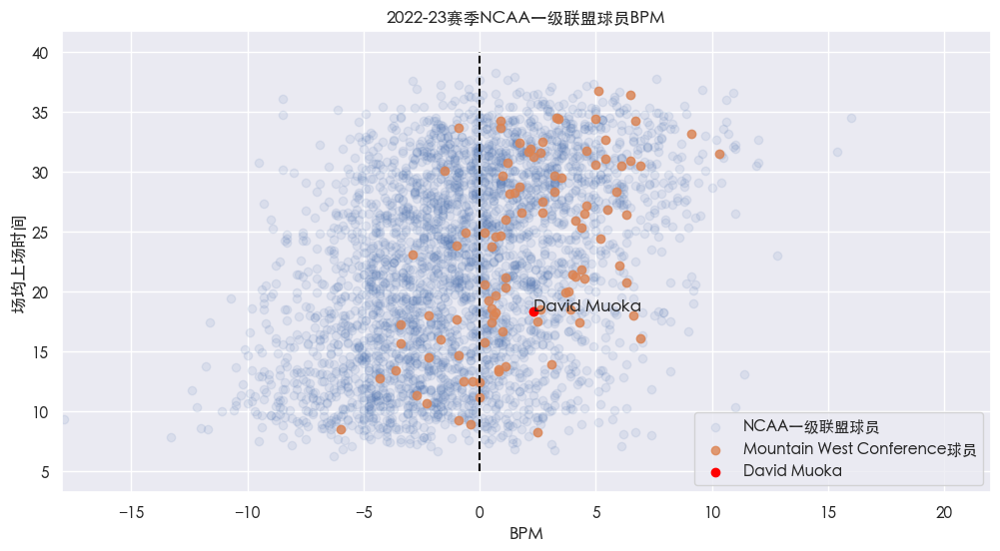

In [150]:
figsize(12, 6)
plot_player_bpm(player, conf, 2023)

#### 大三

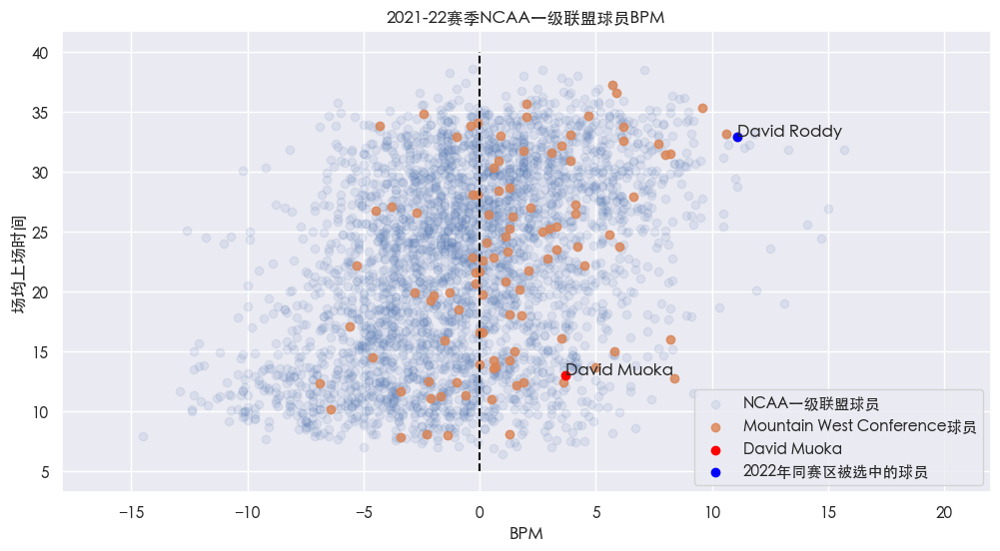

In [144]:
figsize(12, 6)
plot_player_bpm(player, conf, 2022)

#### 大二

In [145]:
conf = 'southland'

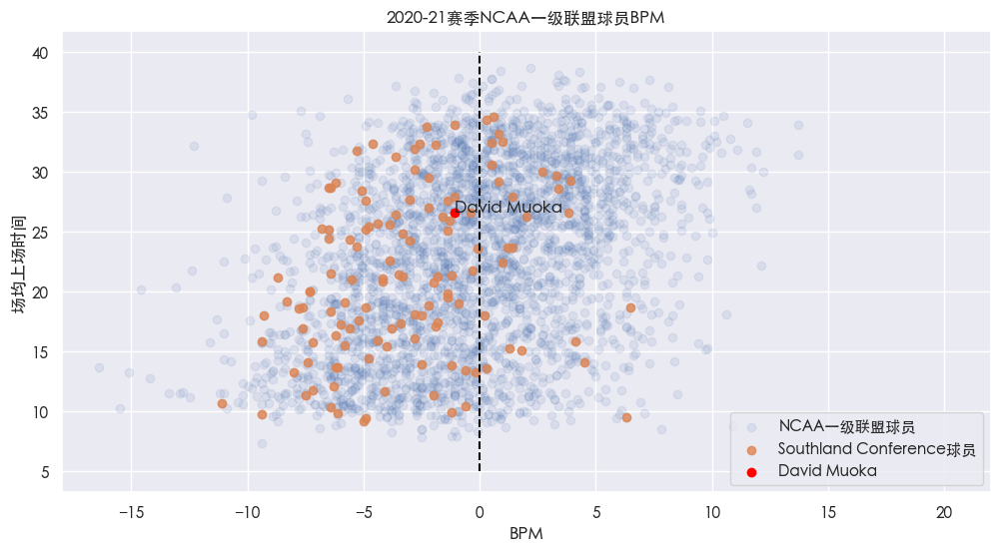

In [147]:
figsize(12, 6)
plot_player_bpm(player, conf, 2021)

#### 大一

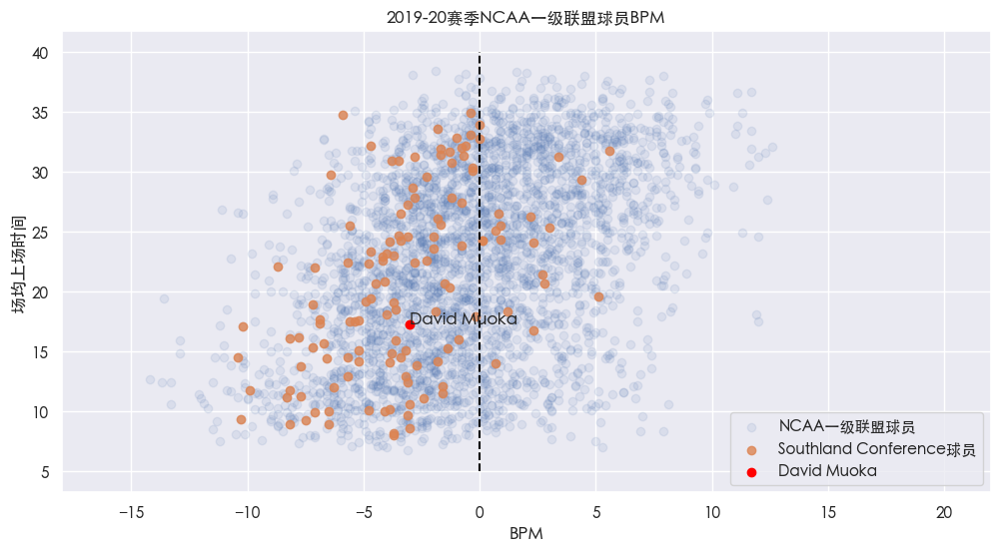

In [148]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020)

### 王翊雄 | Cal State Fullerton | Big West

In [64]:
player = 'Johnny Wang'
conf = 'big-west'

#### 大四

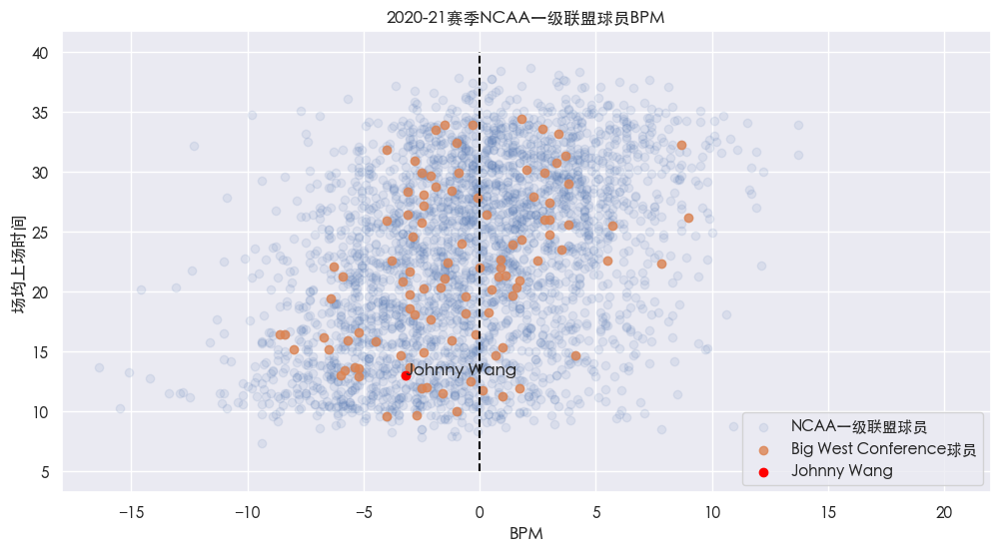

In [77]:
figsize(12, 6)
plot_player_bpm(player, conf, 2021)

#### 大三

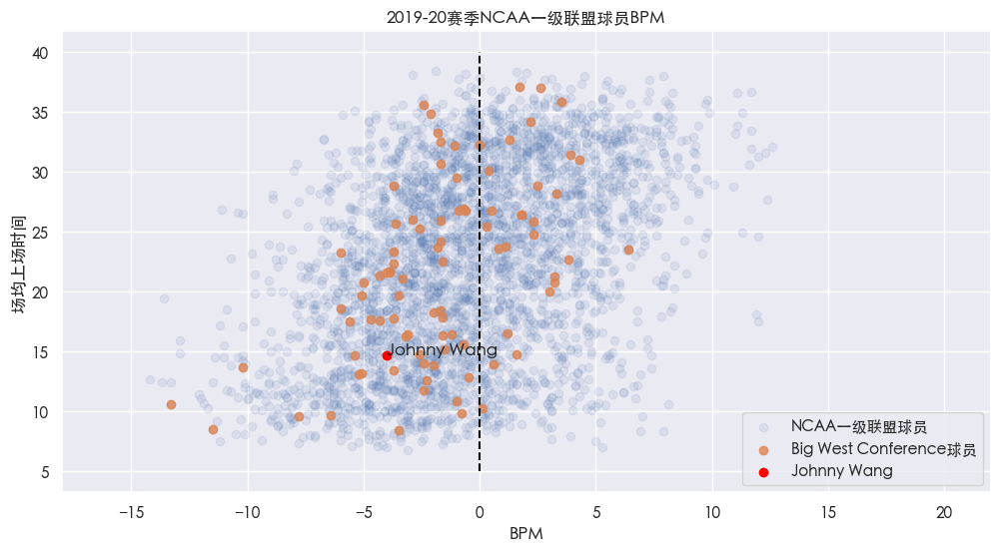

In [78]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020)

#### 大二

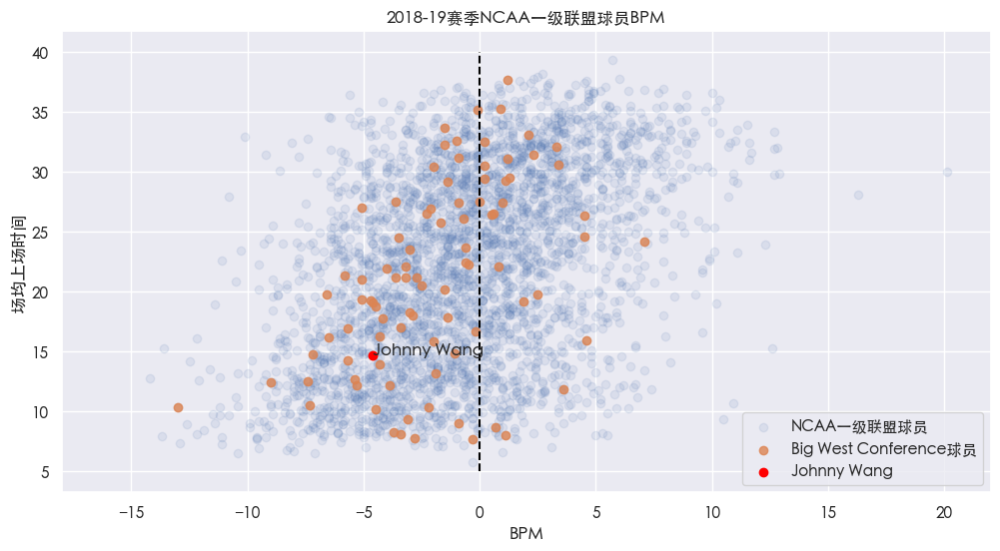

In [79]:
figsize(12, 6)
plot_player_bpm(player, conf, 2019)

### 李弘权 | Lehigh | Patriot League

In [80]:
player = 'Ben Li'
conf = 'patriot'

In [81]:
pat = cbb_df[(cbb_df['conference'] == conf) & (cbb_df['season'] == 2021)]
pat['bpm_rank'] = pat['bpm'].rank(pct=True).apply(lambda x: int(x*100))
pat.sort_values('bpm', ascending=False).head(10)

,player,class,pos,school_name,g,mp,bpm,spr_url,conference,season,mpg,bpm_rank
3627,Jack Ferguson,SR,G,Colgate,16,340.0,9.4,/cbb/players/jack-ferguson-1.html,patriot,2021,21.250000,100
3589,Santi Aldama,SO,F,Loyola (MD),17,595.0,7.7,/cbb/players/santi-aldama-1.html,patriot,2021,35.000000,98
3729,Jeff Woodward,FR,C,Colgate,15,241.0,7.0,/cbb/players/jeff-woodward-1.html,patriot,2021,16.066667,97
3697,Tucker Richardson,JR,G,Colgate,16,490.0,5.6,/cbb/players/tucker-richardson-1.html,patriot,2021,30.625000,96
3669,Sukhmail Mathon,SR,C,Boston University,18,486.0,5.1,/cbb/players/sukhmail-mathon-1.html,patriot,2021,27.000000,95
3690,Neal Quinn,SO,F,Lafayette,14,311.0,5.0,/cbb/players/neal-quinn-1.html,patriot,2021,22.214286,93
3665,Oliver Lynch-Daniels,JR,G,Colgate,16,214.0,4.9,/cbb/players/oliver-lynch-daniels-1.html,patriot,2021,13.375000,92
3603,Jordan Burns,SR,G,Colgate,16,469.0,4.4,/cbb/players/jordan-burns-1.html,patriot,2021,29.312500,91
3612,Cam Davis,SR,G,Navy,15,488.0,3.7,/cbb/players/cam-davis-1.html,patriot,2021,32.533333,90
3673,Ryan Moffatt,SO,G,Colgate,16,357.0,3.4,/cbb/players/ryan-moffatt-1.html,patriot,2021,22.312500,88


In [82]:
pat[pat['player'] == player]

,player,class,pos,school_name,g,mp,bpm,spr_url,conference,season,mpg,bpm_rank
3658,Ben Li,FR,F,Lehigh,14,170.0,-2.8,/cbb/players/ben-li-2.html,patriot,2021,12.142857,35


#### 大一

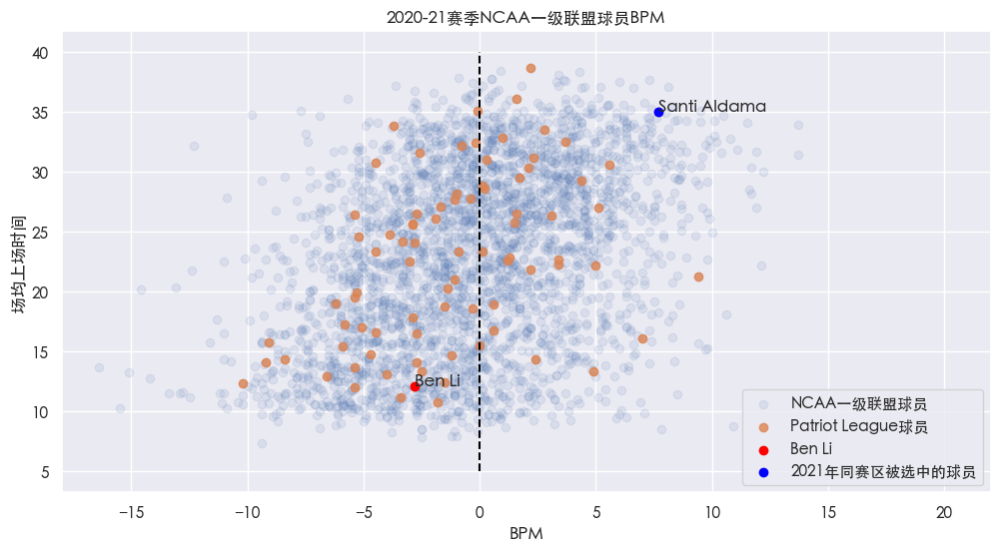

In [83]:
figsize(12, 6)
plot_player_bpm(player, conf, 2021)

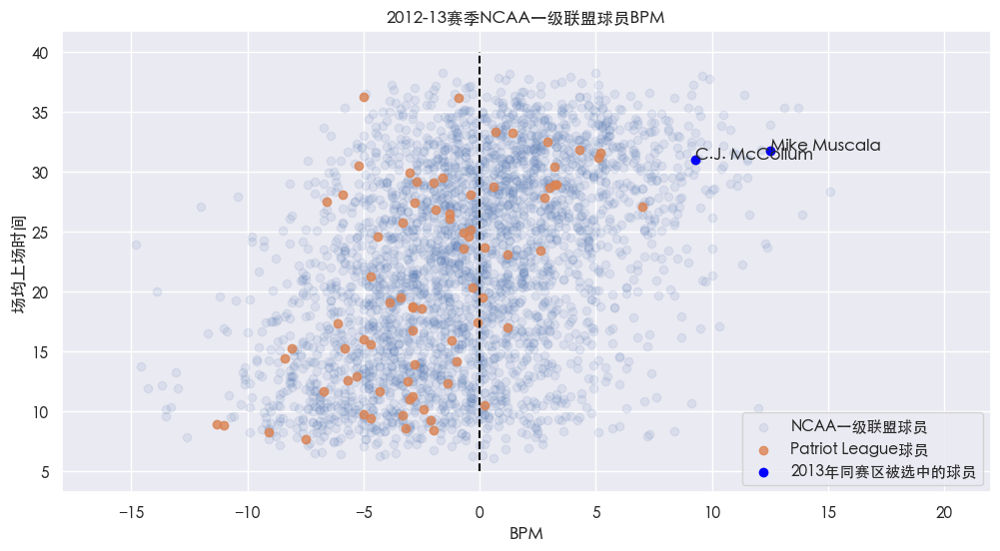

In [84]:
figsize(12, 6)
plot_player_bpm(None, conf, 2013)

In [85]:
cbb_df[cbb_df['conference'] == conf].sort_values('bpm', ascending=False).head(10)

,player,class,pos,school_name,g,mp,bpm,spr_url,conference,season,mpg
3381,Mike Muscala,SR,F,Bucknell,34,1079.0,12.5,/cbb/players/mike-muscala-1.html,patriot,2013,31.735294
3320,C.J. McCollum,JR,G,Lehigh,35,1160.0,11.2,/cbb/players/cj-mccollum-1.html,patriot,2012,33.142857
3627,Jack Ferguson,SR,G,Colgate,16,340.0,9.4,/cbb/players/jack-ferguson-1.html,patriot,2021,21.250000
3372,C.J. McCollum,SR,G,Lehigh,12,372.0,9.3,/cbb/players/cj-mccollum-1.html,patriot,2013,31.000000
3563,Max Mahoney,SR,F,Boston University,34,923.0,8.4,/cbb/players/max-mahoney-1.html,patriot,2020,27.147059
3332,Mike Muscala,JR,F,Bucknell,35,1047.0,8.4,/cbb/players/mike-muscala-1.html,patriot,2012,29.914286
3589,Santi Aldama,SO,F,Loyola (MD),17,595.0,7.7,/cbb/players/santi-aldama-1.html,patriot,2021,35.000000
3729,Jeff Woodward,FR,C,Colgate,15,241.0,7.0,/cbb/players/jeff-woodward-1.html,patriot,2021,16.066667
3331,Ella Ellis,SR,F,Army,31,839.0,7.0,/cbb/players/ella-ellis-1.html,patriot,2013,27.064516
3522,Andrew Kostecka,JR,G,Loyola (MD),32,1064.0,6.5,/cbb/players/andrew-kostecka-1.html,patriot,2019,33.250000


### 张镇麟 | Tulane | AAC

In [86]:
player = 'Kevin Zhang'
conf = 'aac'

#### 大二

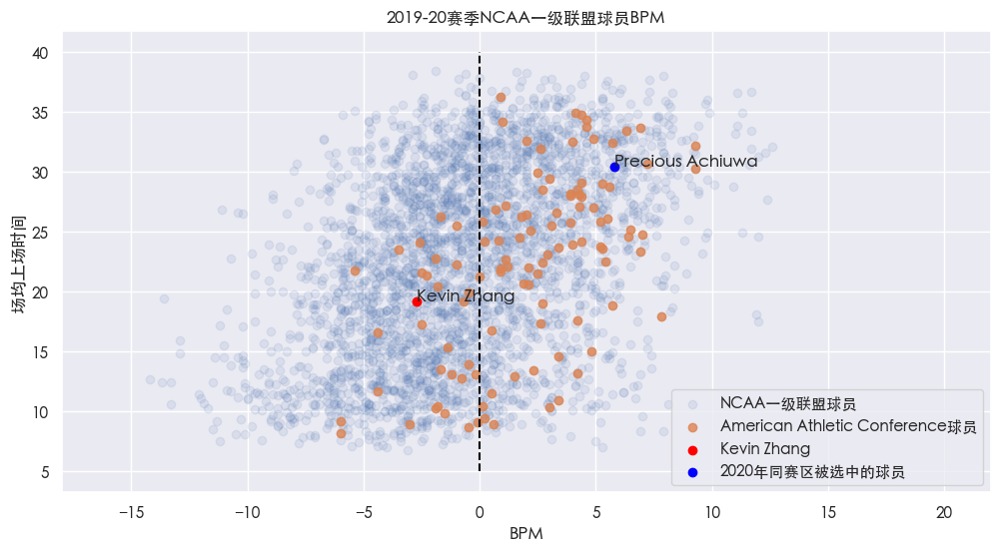

In [87]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020)

#### 大一

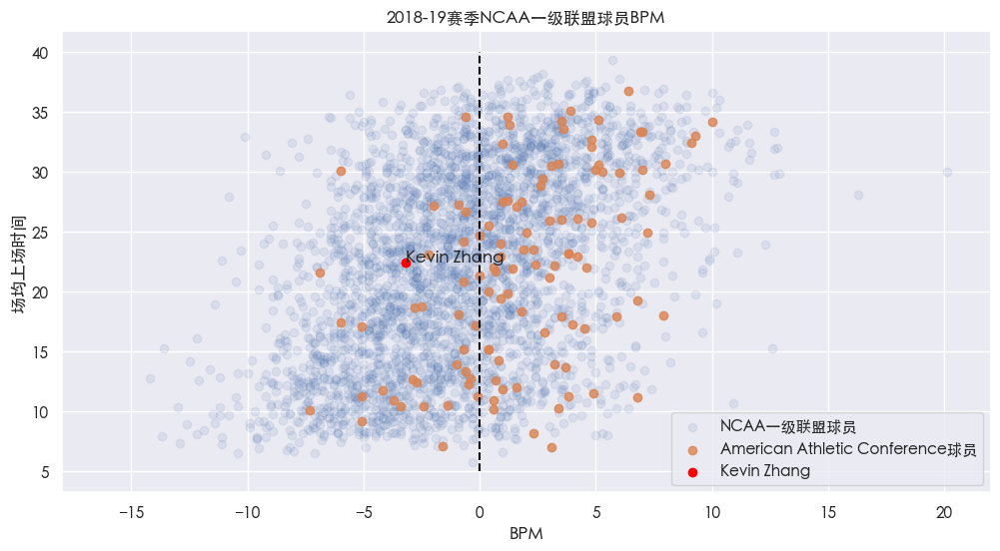

In [88]:
figsize(12, 6)
plot_player_bpm(player, conf, 2019)

### 阿迪力-库尔班 | Kennesaw St | Atlantic Sun

In [89]:
player = 'Adili Kuerban'
conf = 'atlantic-sun'

#### 大二

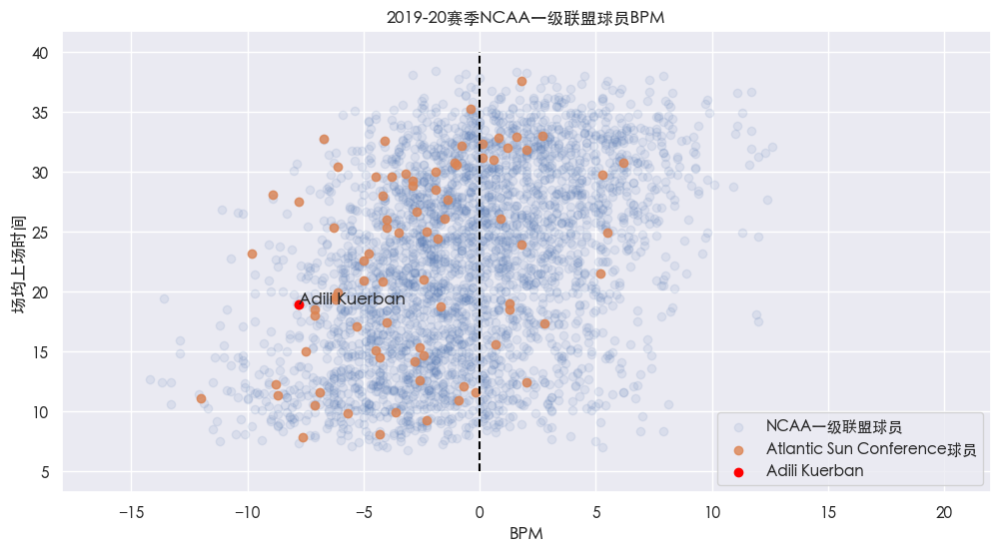

In [90]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020)

### 区俊炫 | Cal State Northridge | Big West

In [91]:
player = 'Michael Ou'
conf = 'big-west'

#### 大二

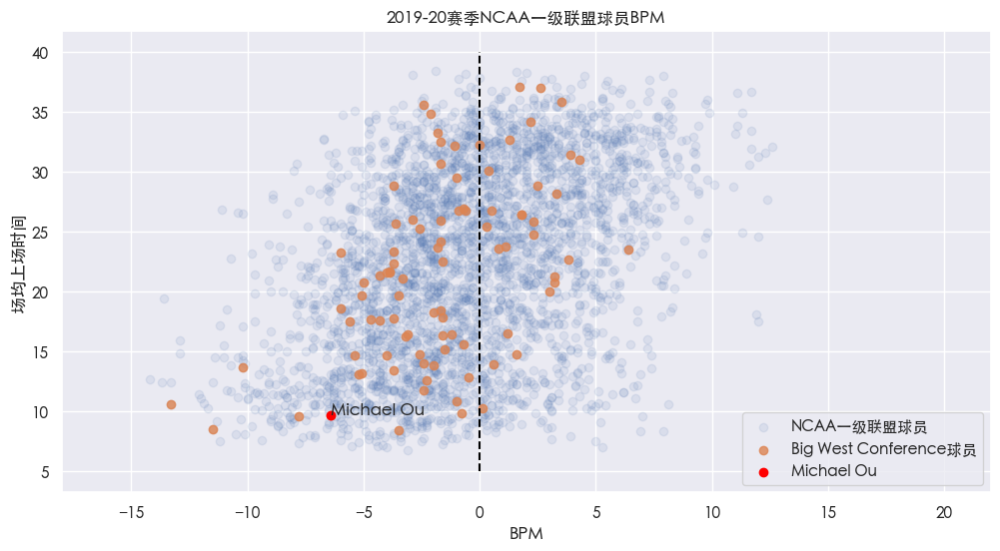

In [92]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020)

#### 大一

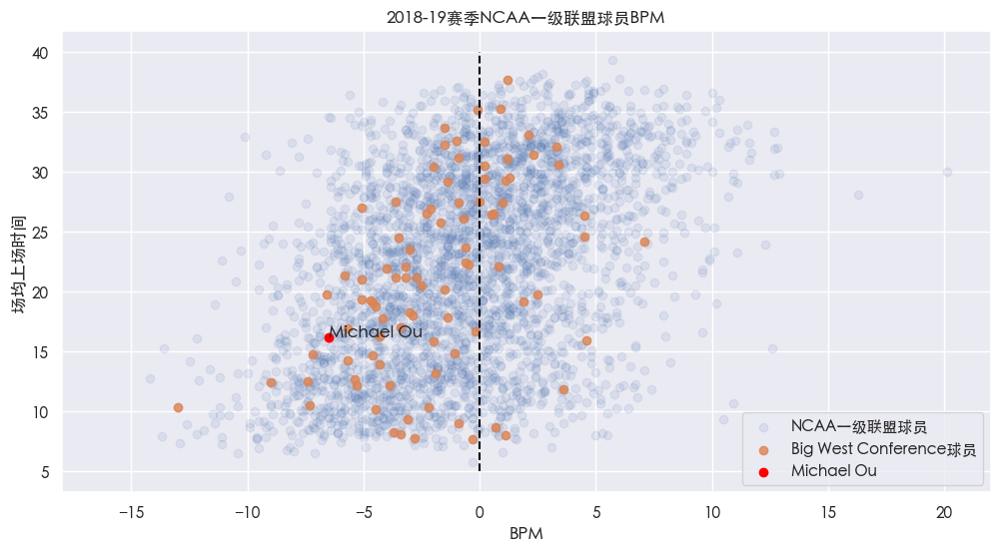

In [93]:
figsize(12, 6)
plot_player_bpm(player, conf, 2019)

### 林庭谦 | Bryant | NEC

In [94]:
player = 'Benson Lin'
conf = 'northeast'

#### 大一

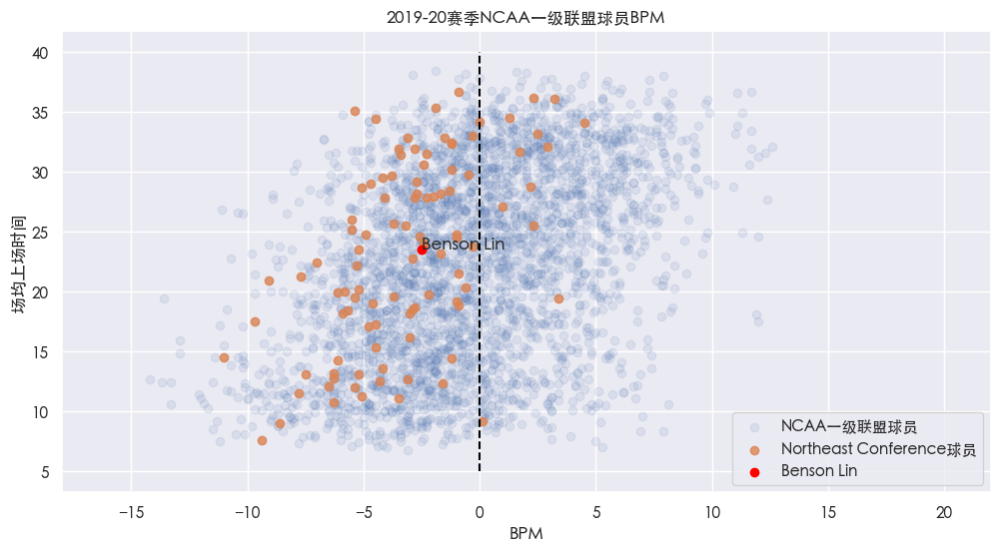

In [95]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020)

### 高国豪 | SE Missouri State | OVC

In [96]:
player = 'Oscar Kao'
conf = 'ovc'

#### 大三

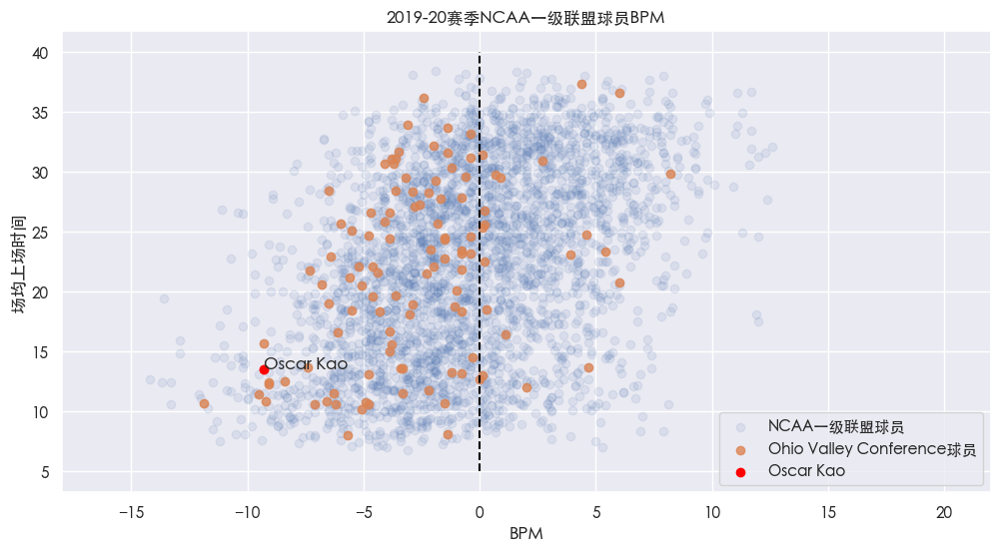

In [97]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020)

### 唐维杰 | VMI | SoCon

In [98]:
player = 'Louis Tang'
conf = 'southern'

大一

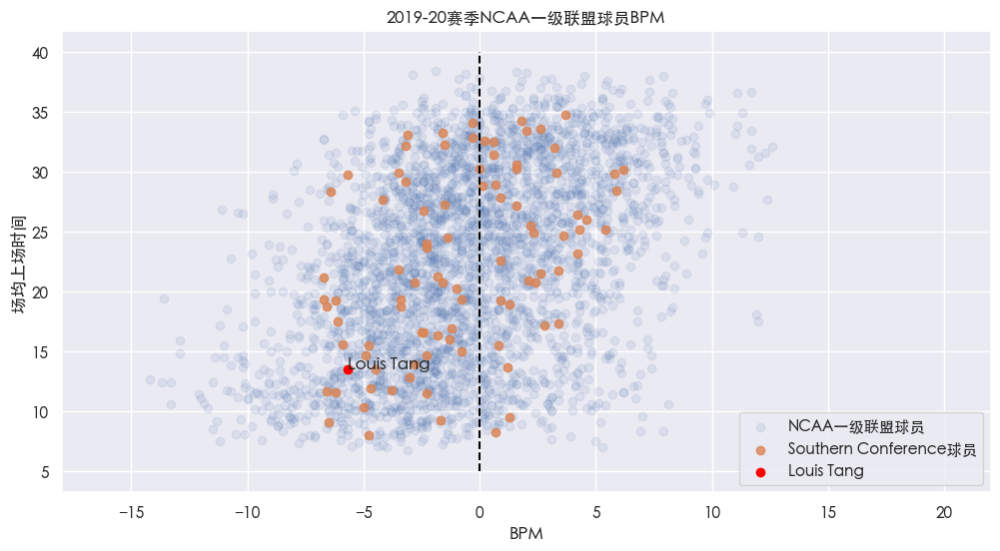

In [99]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020)

### 王泉泽 | Penn | SoCon

In [100]:
player = 'Michael Wang'
conf = 'ivy'

#### 大一

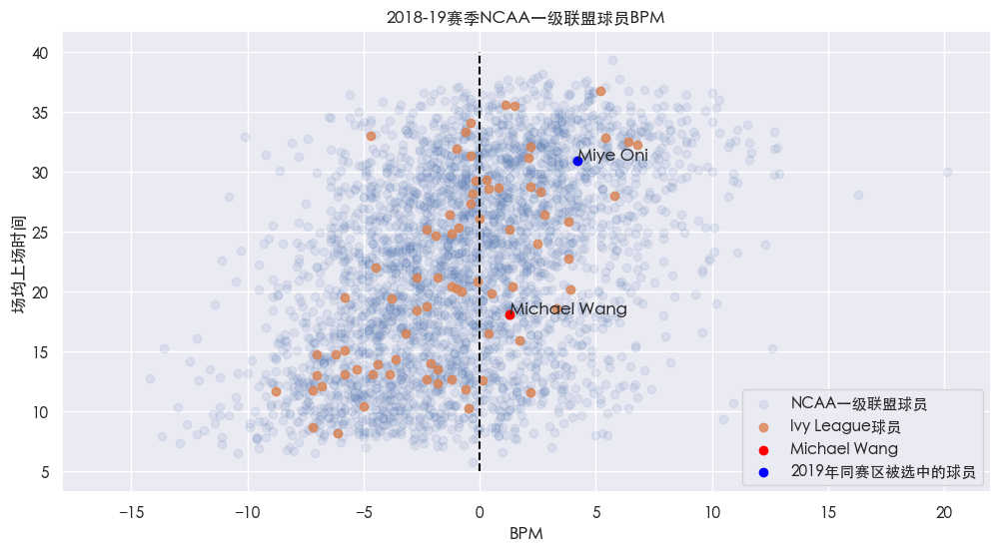

In [101]:
figsize(12, 6)
plot_player_bpm(player, conf, 2019)

### 吴永盛 | Sacramento St | Big Sky

In [102]:
player = 'Jeff Wu'
conf = 'big-sky'

#### 大三

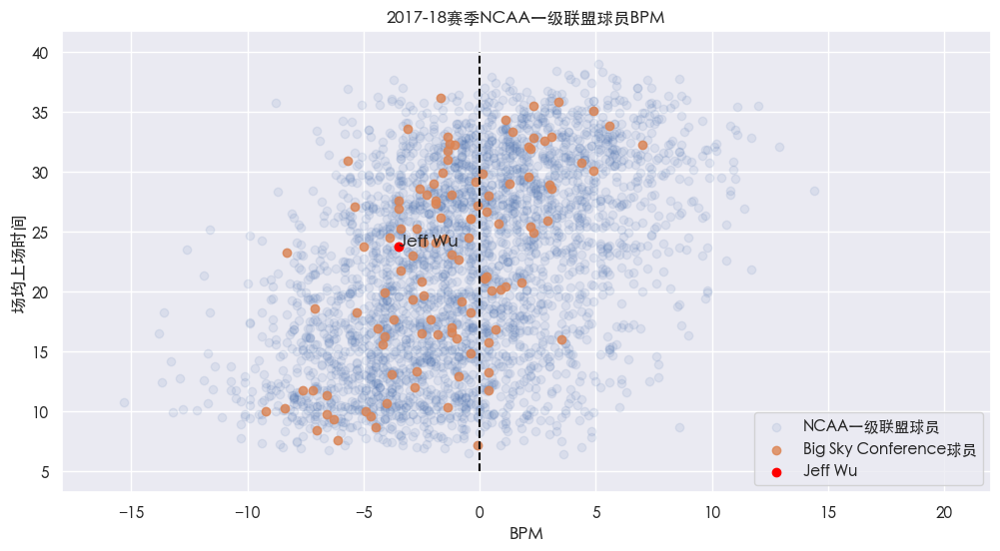

In [103]:
figsize(12, 6)
plot_player_bpm(player, conf, 2018)

#### 大二

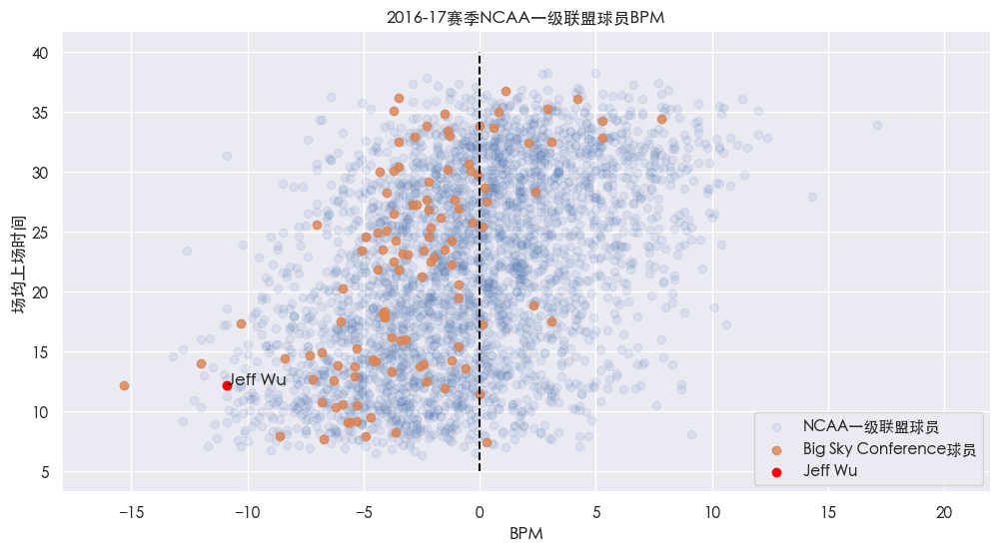

In [104]:
figsize(12, 6)
plot_player_bpm(player, conf, 2017)

#### 大一

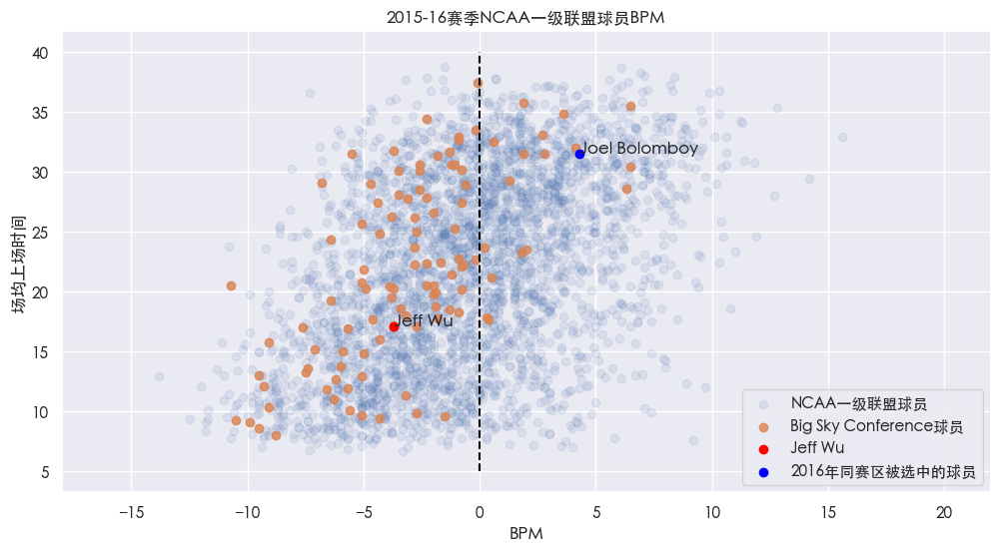

In [105]:
figsize(12, 6)
plot_player_bpm(player, conf, 2016)

### 陈盈骏 | Liberty | Big South

In [106]:
player = 'Ray Chen'
conf = 'big-south'

#### 大四

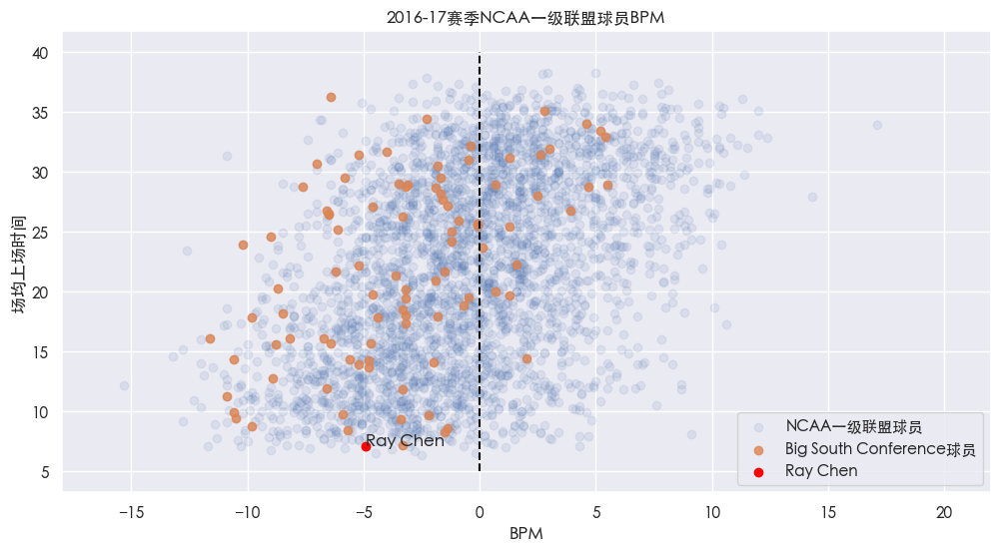

In [107]:
figsize(12, 6)
plot_player_bpm(player, conf, 2017)

### 徐韬 | San Francisco | WCC

In [108]:
player = 'Tao Xu'
conf = 'wcc'

#### 大一

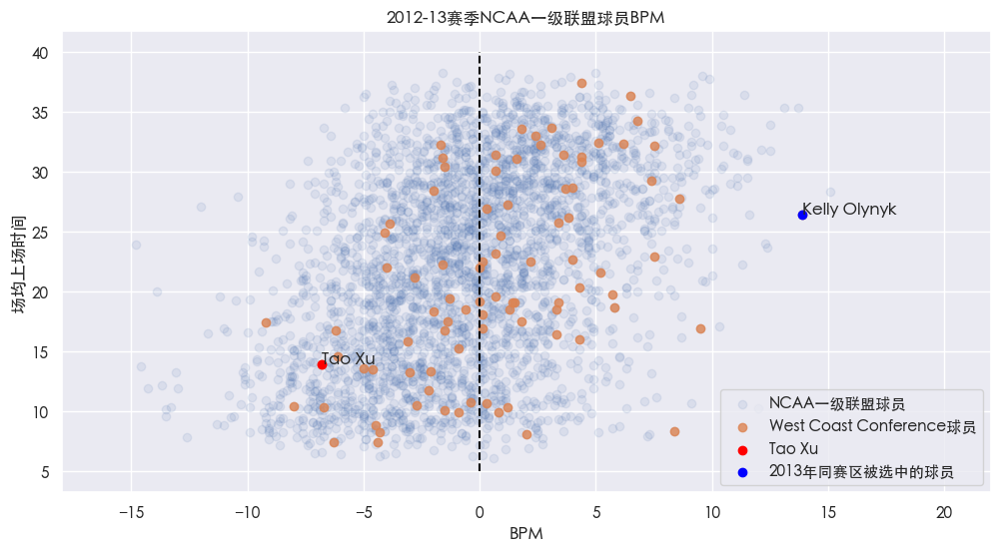

In [109]:
figsize(12, 6)
plot_player_bpm(player, conf, 2013)

### 王泽铭 | Texas A&M-Corpus Christi | Southland

In [110]:
player = 'Ted Wang'
conf = 'southland'

#### 大二

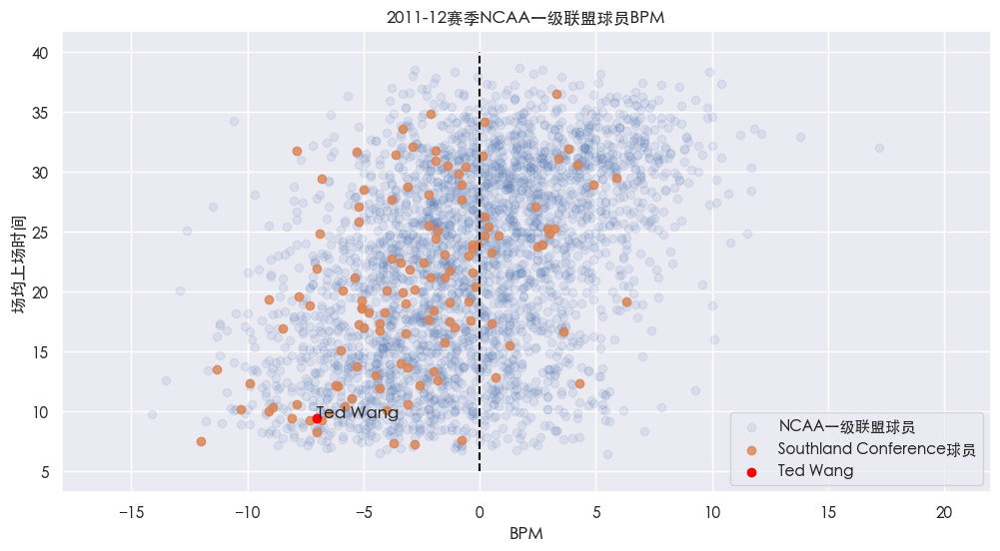

In [111]:
figsize(12, 6)
plot_player_bpm(player, conf, 2012)

### Mike Sharavjamts | Dayton | A-10

In [157]:
player = 'Mike Sharavjamts'
conf = 'atlantic-10'

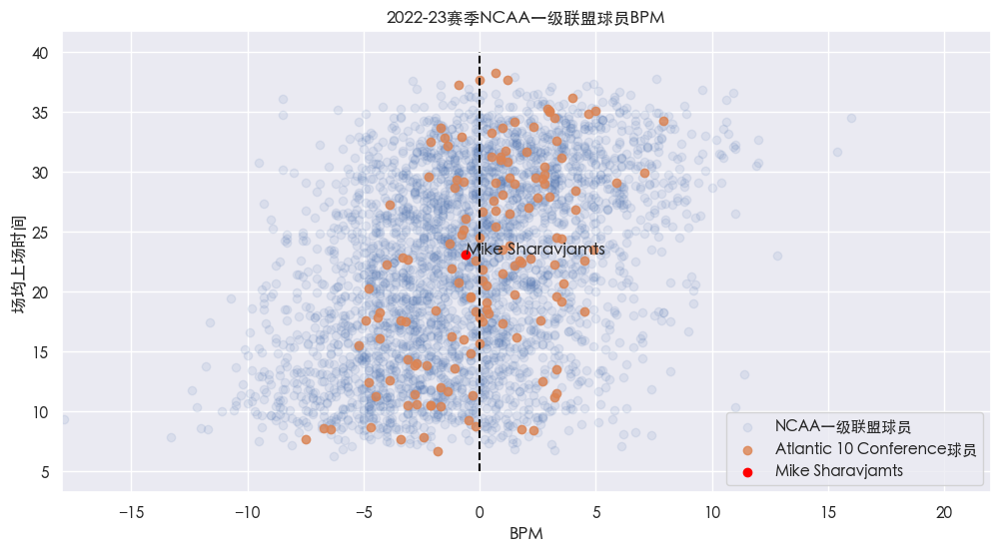

In [158]:
figsize(12, 6)
plot_player_bpm(player, conf, 2023, jk_players_p15)

### 福永启生 | Nebraska | Big Ten

In [153]:
player = 'Keisei Tominaga'
conf = 'big-ten'

#### 大三

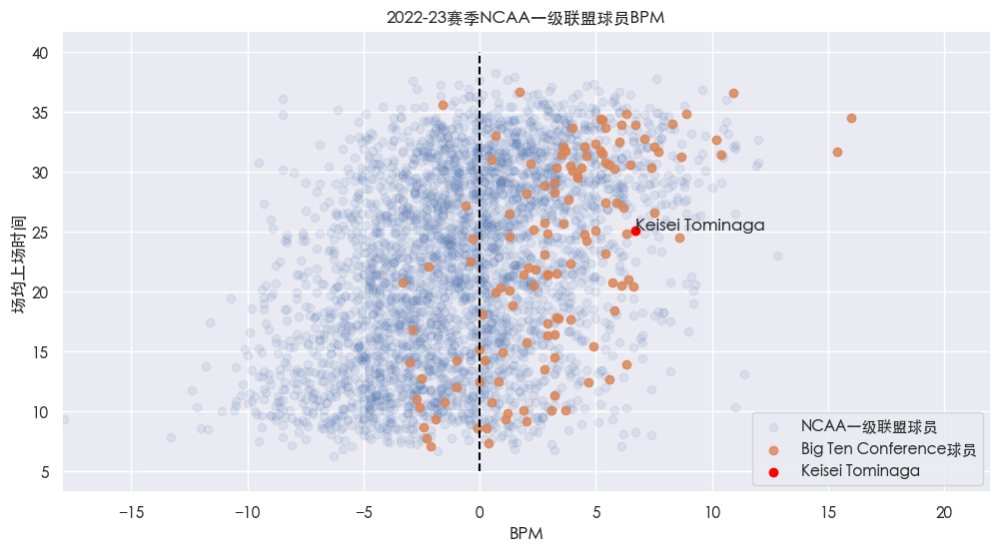

In [154]:
figsize(12, 6)
plot_player_bpm(player, conf, 2023, jk_players_p15)

#### 大二

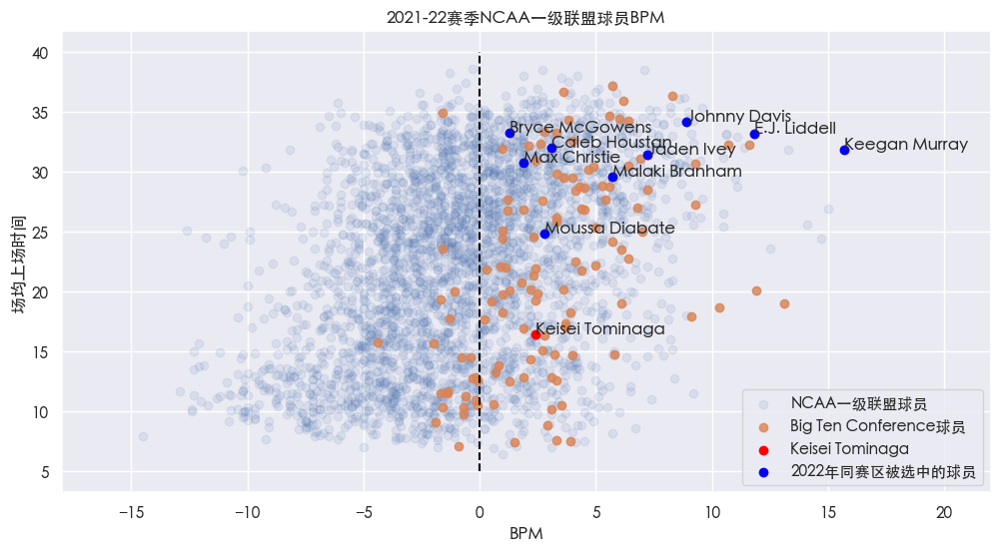

In [130]:
figsize(12, 6)
plot_player_bpm(player, conf, 2022, jk_players_p15)

### 李贤政 | Davidson | A-10

In [112]:
player = 'Hyunjung Lee'
conf = 'atlantic-10'

In [113]:
cbb_df[(cbb_df.season==2021) & (cbb_df.conference==conf)].sort_values('bpm').tail(10)

,player,class,pos,school_name,g,mp,bpm,spr_url,conference,season,mpg
717,Dominick Welch,JR,G,St. Bonaventure,21,719.0,6.2,/cbb/players/dominick-welch-1.html,atlantic-10,2021,34.238095
677,Javonte Perkins,SR,G,Saint Louis,21,640.0,6.4,/cbb/players/javonte-perkins-1.html,atlantic-10,2021,30.476190
621,Michael Hughes,SR,C,Duquesne,18,484.0,6.4,/cbb/players/michael-hughes-2.html,atlantic-10,2021,26.888889
711,Hason Ward,SO,F,Virginia Commonwealth,26,559.0,6.5,/cbb/players/hason-ward-1.html,atlantic-10,2021,21.500000
602,Jordan Goodwin,SR,G,Saint Louis,21,696.0,7.3,/cbb/players/jordan-goodwin-1.html,atlantic-10,2021,33.142857
600,Jacob Gilyard,SR,G,Richmond,23,866.0,7.3,/cbb/players/jacob-gilyard-1.html,atlantic-10,2021,37.652174
643,Hyunjung Lee,SO,G,Davidson,22,657.0,7.8,/cbb/players/hyunjung-lee-1.html,atlantic-10,2021,29.863636
622,Nah'Shon Hyland,SO,G,Virginia Commonwealth,24,766.0,8.2,/cbb/players/nahshon-hyland-1.html,atlantic-10,2021,31.916667
661,Tre Mitchell,SO,C,Massachusetts,13,419.0,8.3,/cbb/players/tre-mitchell-1.html,atlantic-10,2021,32.230769
675,Osun Osunniyi,JR,F,St. Bonaventure,21,720.0,8.9,/cbb/players/osun-osunniyi-1.html,atlantic-10,2021,34.285714


#### 大二

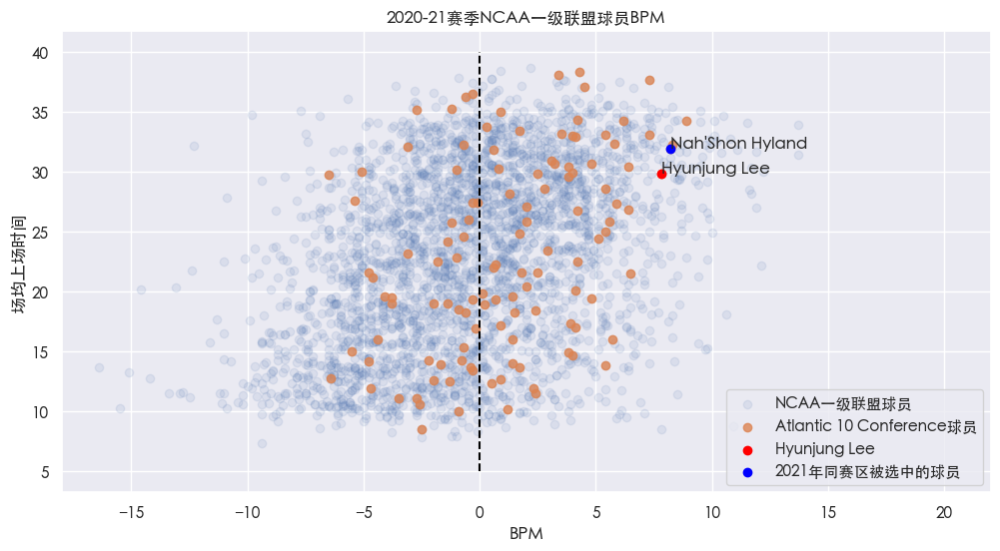

In [114]:
figsize(12, 6)
plot_player_bpm(player, conf, 2021, jk_players_p15)

#### 大一

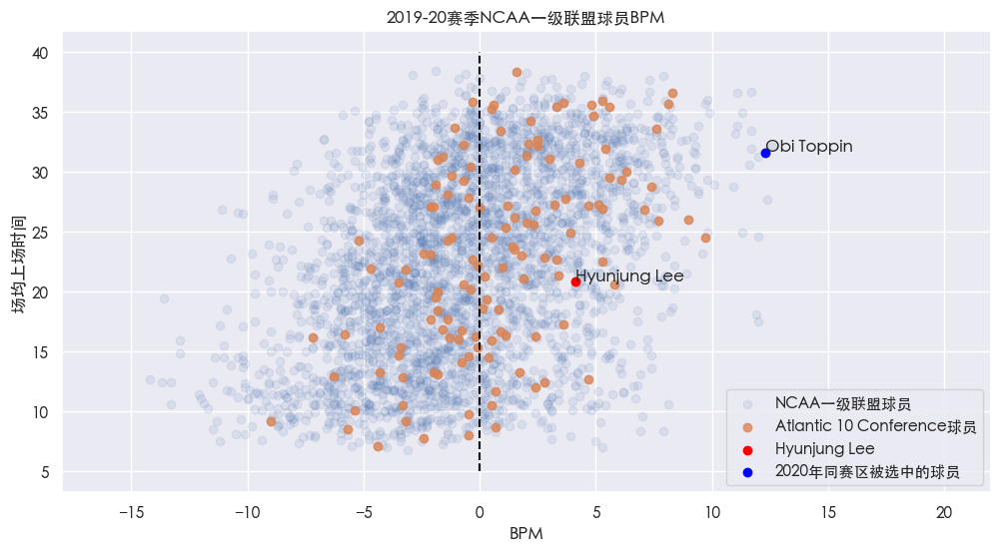

In [115]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020, jk_players_p15)

### 提布斯-海 | UNC Wilmington | CAA

In [116]:
player = 'Kai Toews'
conf = 'colonial'

#### 大二

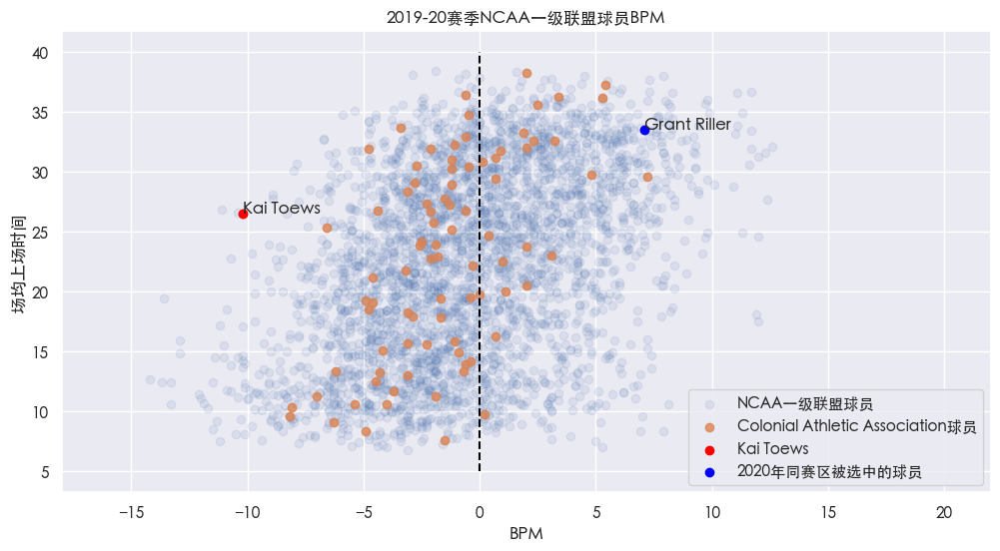

In [117]:
figsize(12, 6)
plot_player_bpm(player, conf, 2020, jk_players_p15)

#### 大一

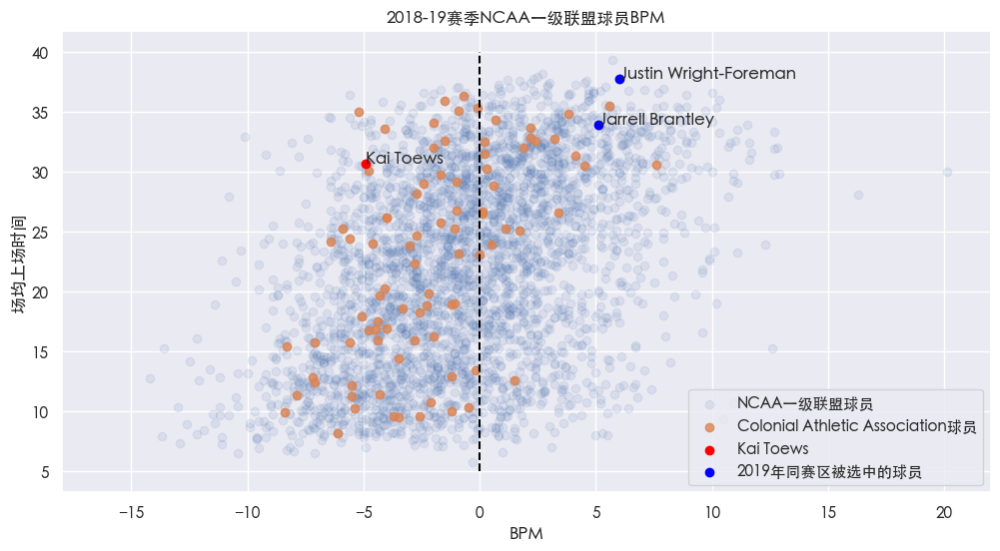

In [118]:
figsize(12, 6)
plot_player_bpm(player, conf, 2019, jk_players_p15)

### 八村垒 | Gonzaga | WCC

In [119]:
player = 'Rui Hachimura'
conf = 'wcc'

#### 大三

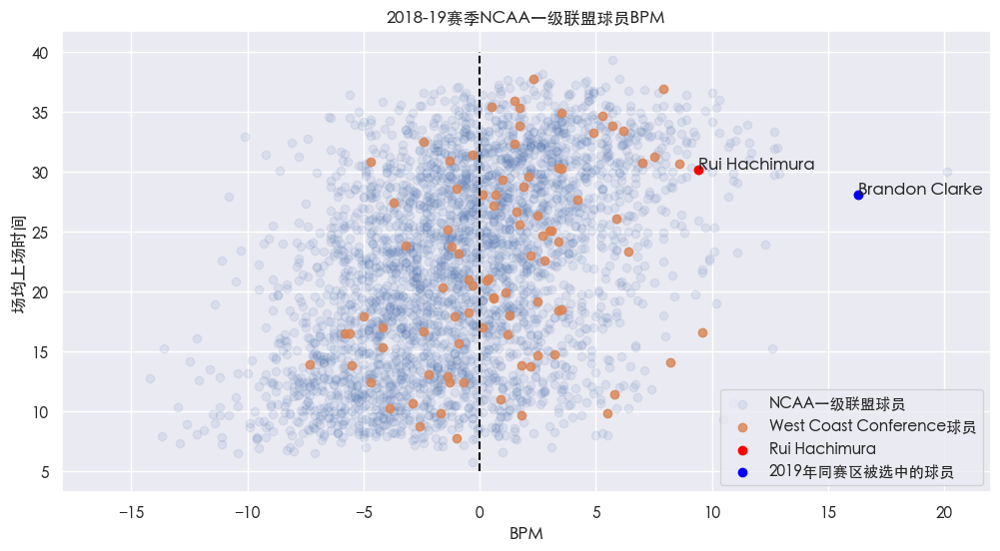

In [120]:
figsize(12, 6)
plot_player_bpm(player, conf, 2019, jk_players_p15)

#### 大二

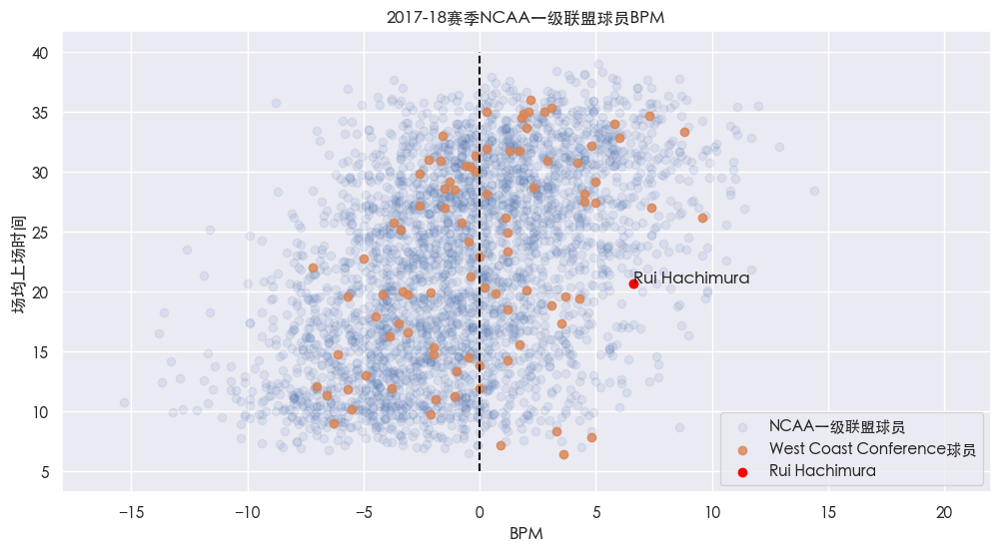

In [121]:
figsize(12, 6)
plot_player_bpm(player, conf, 2018, jk_players_p15)

### 渡边雄太 | George Washington | A-10

In [122]:
player = 'Yuta Watanabe'
conf = 'atlantic-10'

#### 大四

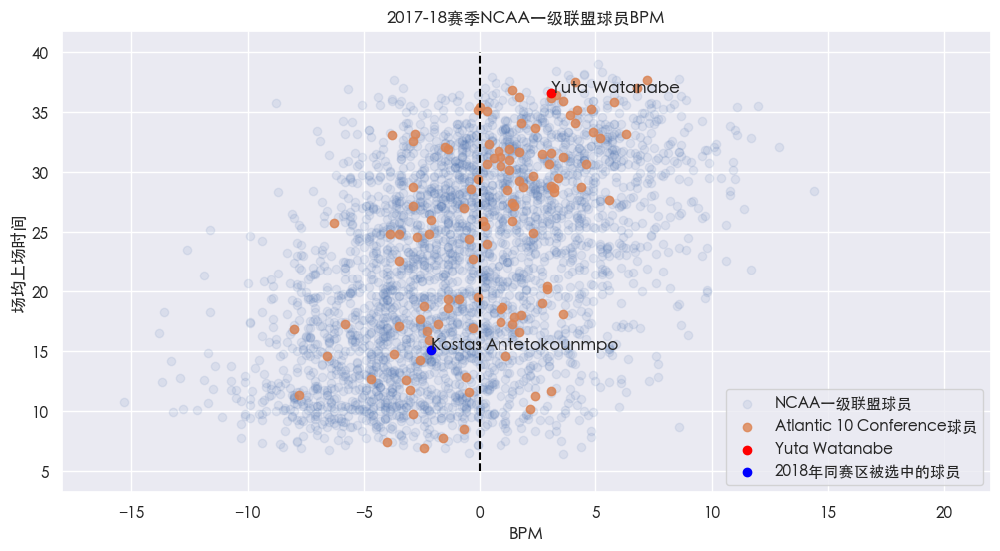

In [123]:
figsize(12, 6)
plot_player_bpm(player, conf, 2018, jk_players_p15)

#### 大三

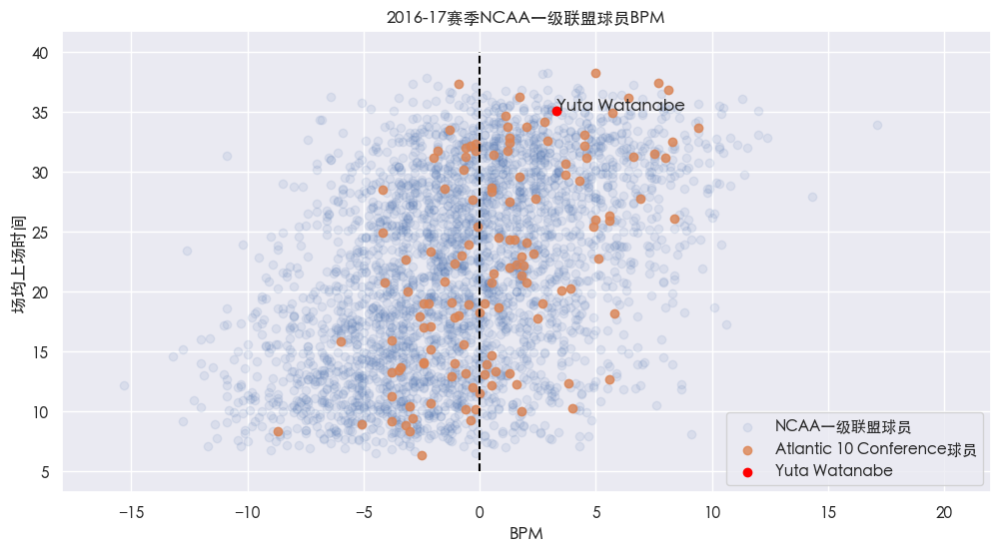

In [124]:
figsize(12, 6)
plot_player_bpm(player, conf, 2017, jk_players_p15)

#### 大二

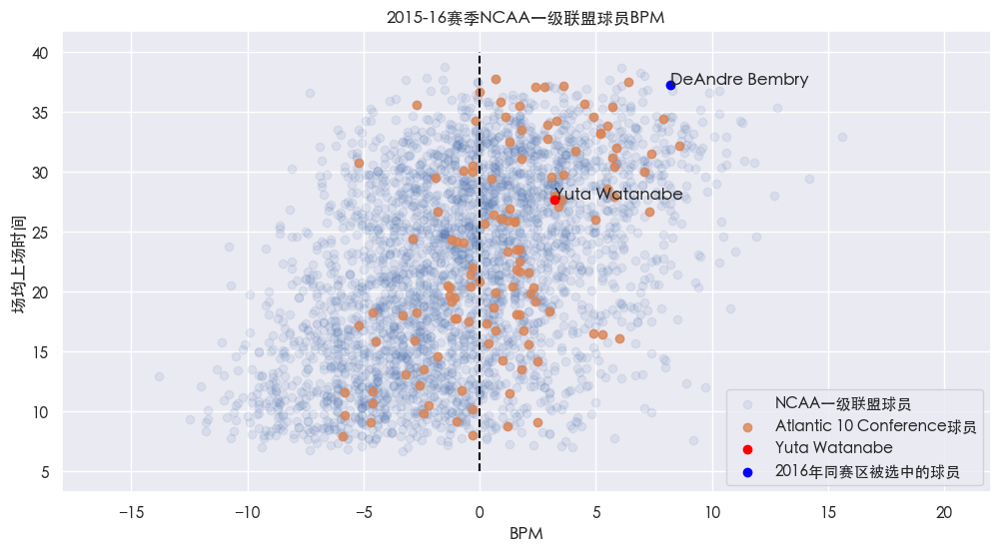

In [125]:
figsize(12, 6)
plot_player_bpm(player, conf, 2016, jk_players_p15)

#### 大一

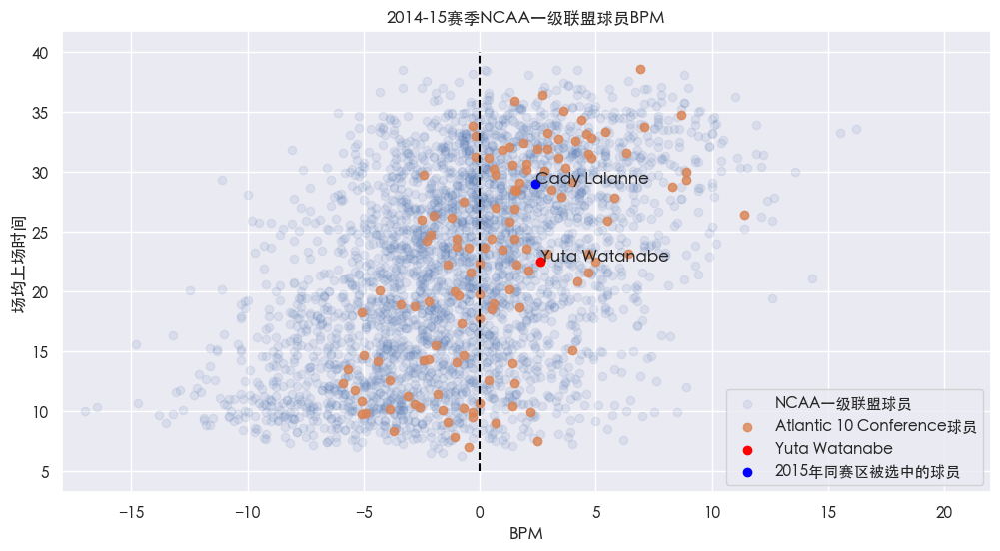

In [126]:
figsize(12, 6)
plot_player_bpm(player, conf, 2015, jk_players_p15)